# PROJECT 3:

## Supevised Machine Learning - Classification [African Country Recession (2000 to 2017)]

This notebook is a part of my third project from the IBM Machine Learning certificate.

The main objective of this analysis is to attempt to predict which factors contribute most to, or are most indicative of, recessions in Africa using classification. The target variable of this analysis is the ‘growthbucket’ variable and that column denotes either a "1" for "Recession" or "0" for "No_Recession". This dataset covers the period between the years 2000 and 2017.

Source Data: https://www.kaggle.com/chirin/african-country-recession-dataset-2000-to-2017

Notebook Contents



## Exploratory Data Analysis

In [1]:
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
%matplotlib inline

In [2]:
# We take a preliminary look at the data after loading it
filepath = "africa_recession.csv"
data = pd.read_csv(filepath)
data.head()

,pop,emp,emp_to_pop_ratio,hc,ccon,cda,cn,ck,ctfp,cwtfp,...,agriculture,fish,total_change,excl_energy_change,energy_change,metals_minerals_change,forestry_change,agriculture_change,fish_change,growthbucket
0,28.849621,6.914298,0.239667,1.547767,99010.171880,131991.375000,426543.343800,0.009374,0.648979,0.626111,...,149.37,876.46,0.264843,0.012115,0.717188,0.099935,-0.061177,0.073986,0.007576,0
1,45.728313,13.623806,0.297929,2.086037,316862.656300,374842.343800,804602.250000,0.019658,0.719390,0.657543,...,149.37,876.46,0.264843,0.012115,0.717188,0.099935,-0.061177,0.073986,0.007576,0
2,33.262043,13.323813,0.400571,1.498783,29762.876950,36584.992190,67072.593750,0.001670,0.308652,0.292607,...,149.37,876.46,0.264843,0.012115,0.717188,0.099935,-0.061177,0.073986,0.007576,0
3,8.025703,3.869000,0.482076,1.356151,6488.692871,7006.969727,5790.396973,0.000184,0.205865,0.234643,...,149.37,876.46,0.264843,0.012115,0.717188,0.099935,-0.061177,0.073986,0.007576,0
4,1.061468,0.243000,0.228928,1.676330,7620.187500,8419.264648,16907.236330,0.000431,0.959765,0.993985,...,149.37,876.46,0.264843,0.012115,0.717188,0.099935,-0.061177,0.073986,0.007576,0


In [3]:
print("Number of rows in the data:", data.shape[0])
print("Number of columns in the data:", data.shape[1])

Number of rows in the data: 486
Number of columns in the data: 50


In [4]:
# The different columns in the dataset
print(data.columns.tolist())

['pop', 'emp', 'emp_to_pop_ratio', 'hc', 'ccon', 'cda', 'cn', 'ck', 'ctfp', 'cwtfp', 'rconna', 'rdana', 'rnna', 'rkna', 'rtfpna', 'rwtfpna', 'labsh', 'irr', 'delta', 'xr', 'pl_con', 'pl_da', 'pl_gdpo', 'csh_c', 'csh_i', 'csh_g', 'csh_x', 'csh_m', 'csh_r', 'pl_c', 'pl_i', 'pl_g', 'pl_x', 'pl_m', 'pl_n', 'total', 'excl_energy', 'energy', 'metals_minerals', 'forestry', 'agriculture', 'fish', 'total_change', 'excl_energy_change', 'energy_change', 'metals_minerals_change', 'forestry_change', 'agriculture_change', 'fish_change', 'growthbucket']


In [5]:
# The different types of data
print(data.dtypes)

pop                       float64
emp                       float64
emp_to_pop_ratio          float64
hc                        float64
ccon                      float64
cda                       float64
cn                        float64
ck                        float64
ctfp                      float64
cwtfp                     float64
rconna                    float64
rdana                     float64
rnna                      float64
rkna                      float64
rtfpna                    float64
rwtfpna                   float64
labsh                     float64
irr                       float64
delta                     float64
xr                        float64
pl_con                    float64
pl_da                     float64
pl_gdpo                   float64
csh_c                     float64
csh_i                     float64
csh_g                     float64
csh_x                     float64
csh_m                     float64
csh_r                     float64
pl_c          

In [6]:
# We check to see if there are any missing values in each column
data.isna().sum()

pop                       0
emp                       0
emp_to_pop_ratio          0
hc                        0
ccon                      0
cda                       0
cn                        0
ck                        0
ctfp                      0
cwtfp                     0
rconna                    0
rdana                     0
rnna                      0
rkna                      0
rtfpna                    0
rwtfpna                   0
labsh                     0
irr                       0
delta                     0
xr                        0
pl_con                    0
pl_da                     0
pl_gdpo                   0
csh_c                     0
csh_i                     0
csh_g                     0
csh_x                     0
csh_m                     0
csh_r                     0
pl_c                      0
pl_i                      0
pl_g                      0
pl_x                      0
pl_m                      0
pl_n                      0
total               

In [7]:
# Get descriptive statistics of the dataset
data.describe()

,pop,emp,emp_to_pop_ratio,hc,ccon,cda,cn,ck,ctfp,cwtfp,...,agriculture,fish,total_change,excl_energy_change,energy_change,metals_minerals_change,forestry_change,agriculture_change,fish_change,growthbucket
count,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000,4.860000e+02,486.000000,486.000000,486.000000,...,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000,486.000000
mean,20.185755,7.121089,0.357865,1.777389,64361.006942,80885.988722,2.442244e+05,0.004583,0.454419,0.453431,...,221.326667,1009.445556,0.044535,0.030346,0.082411,0.058144,0.024774,0.033930,0.023741,0.078189
std,30.037490,9.921471,0.080541,0.446339,129634.856793,156740.416624,4.725163e+05,0.008210,0.206562,0.203056,...,49.803981,140.125951,0.184025,0.105616,0.288454,0.151285,0.129924,0.127101,0.076937,0.268746
min,1.061468,0.243000,0.198212,1.069451,2781.259277,2984.366943,5.790397e+03,0.000124,0.098622,0.107790,...,149.370000,843.660000,-0.359446,-0.173741,-0.477017,-0.157564,-0.174550,-0.225998,-0.113858,0.000000
25%,3.830730,1.048750,0.297922,1.445886,9117.209716,11081.697755,2.429231e+04,0.000514,0.301179,0.295615,...,185.770000,899.190000,-0.058931,-0.044322,-0.102940,-0.053405,-0.060792,-0.026451,-0.020995,0.000000
50%,10.868272,4.184000,0.368841,1.689902,17471.495120,22228.022460,6.432356e+04,0.001355,0.400647,0.405870,...,213.095000,948.745000,0.061860,0.019950,0.054933,0.046808,0.003277,0.038444,0.006529,0.000000
75%,24.220695,8.517560,0.416717,2.117452,58016.873047,69676.791020,1.886244e+05,0.003227,0.616736,0.603459,...,265.400000,1095.320000,0.208732,0.105791,0.245094,0.154531,0.096810,0.112793,0.047421,0.000000
max,190.886307,65.156548,0.555433,2.885300,758455.187500,896604.812500,2.886312e+06,0.041835,0.998187,1.031707,...,308.050000,1276.530000,0.264843,0.218346,0.717188,0.476204,0.300217,0.320880,0.165440,1.000000


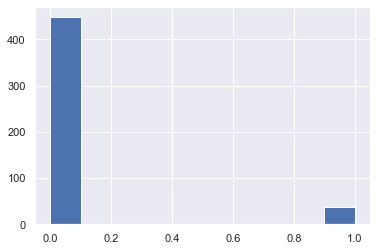

In [8]:
# We will begin by determining if our target variable is normally distributed using a histogram
data.growthbucket.hist();

We have determined the following:

    - There are 50 columns and 486 rows in this dataset. 
    - This dataset has 2 types of data, float64 and int64. It has no object data type. 
    - There are no missing values in any of the columns.
    - We also note that the target variable is heavily skewed towards "0" (No recession).
    - We will use Log Transform to adjust the skewed data, this will decrease the effect of the outliers.

## Data Cleaning and Feature Engineering

In [9]:
# We create a list of float colums to check for skewing
mask = data.dtypes == float
float_cols = data.columns[mask]

skew_limit = 0.75 # define a limit above which we will log transform
skew_vals = data[float_cols].skew()

In [10]:
# We then take a look at the skewed columns
skew_cols = (skew_vals
             .sort_values(ascending=False)
             .to_frame()
             .rename(columns={0:'Skew'})
             .query('abs(Skew) > {}'.format(skew_limit)))

skew_cols

,Skew
pl_n,11.542447
xr,4.331875
pop,3.542553
ccon,3.517852
cda,3.359321
rconna,3.322766
emp,3.306879
cn,3.248863
rdana,3.144799
ck,2.772329


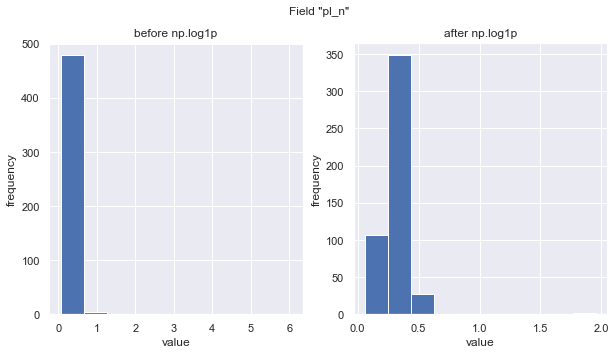

In [11]:
# Let's look at what happens to one of these features, when we apply np.log1p visually.

# Choose a field
field = "pl_n"

# Create two "subplots" and a "figure" using matplotlib
fig, (ax_before, ax_after) = plt.subplots(1, 2, figsize=(10, 5))

# Create a histogram on the "ax_before" subplot
data[field].hist(ax=ax_before)

# Apply a log transformation (numpy syntax) to this column
data[field].apply(np.log1p).hist(ax=ax_after)

# Formatting of titles etc. for each subplot
ax_before.set(title='before np.log1p', ylabel='frequency', xlabel='value')
ax_after.set(title='after np.log1p', ylabel='frequency', xlabel='value')
fig.suptitle('Field "{}"'.format(field));

In [12]:
# We can see that the skew transformation makes a difference to features that need it
# We then perform the skew transformation:

for col in skew_cols.index.values:
    if col == "growthbucket":
        continue
    data[col] = data[col].apply(np.log1p) 

In [13]:
# We now apply basic feature transformations to some of the columns.
smaller_data = data.loc[:,['pl_n', 'xr', 'pop', 'ck', 'rnna', 'csh_x', 'rkna', 'pl_g', 'delta',
                      'ccon', 'cda', 'rconna', 'emp', 'cn', 'rdana', 'irr', 'pl_c', 'metals_minerals_change',
                      'rtfpna', 'forestry_change', 'csh_i', 'pl_con', 'rwtfpna',
                      'fish','csh_m', 'growthbucket']]

In [14]:
# Now we take a look at the summary statistics of the subset data
smaller_data.describe().T

,count,mean,std,min,25%,50%,75%,max
pl_n,486.0,0.317419,0.142612,0.060854,0.258300,0.305757,0.359880,1.952765
xr,486.0,4.518055,2.192466,0.693147,2.262719,5.030892,6.312674,8.907265
pop,486.0,2.446016,1.084477,0.723418,1.574998,2.473869,3.227665,5.256903
ck,486.0,0.004539,0.008082,0.000124,0.000514,0.001355,0.003222,0.040984
rnna,486.0,11.479347,1.454130,9.075311,10.453317,11.213603,12.424419,14.768087
csh_x,486.0,0.149081,0.112894,0.012132,0.058201,0.128262,0.200372,0.611528
rkna,486.0,0.639021,0.167561,0.128238,0.536474,0.659281,0.711658,1.394736
pl_g,486.0,0.335413,0.109021,0.043277,0.261635,0.324365,0.403589,0.790842
delta,486.0,0.046900,0.011543,0.024563,0.040425,0.045275,0.051398,0.089789
ccon,486.0,10.070267,1.273333,7.931019,9.118025,9.768365,10.968503,13.539040


In [15]:
smaller_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 486 entries, 0 to 485
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   pl_n                    486 non-null    float64
 1   xr                      486 non-null    float64
 2   pop                     486 non-null    float64
 3   ck                      486 non-null    float64
 4   rnna                    486 non-null    float64
 5   csh_x                   486 non-null    float64
 6   rkna                    486 non-null    float64
 7   pl_g                    486 non-null    float64
 8   delta                   486 non-null    float64
 9   ccon                    486 non-null    float64
 10  cda                     486 non-null    float64
 11  rconna                  486 non-null    float64
 12  emp                     486 non-null    float64
 13  cn                      486 non-null    float64
 14  rdana                   486 non-null    fl

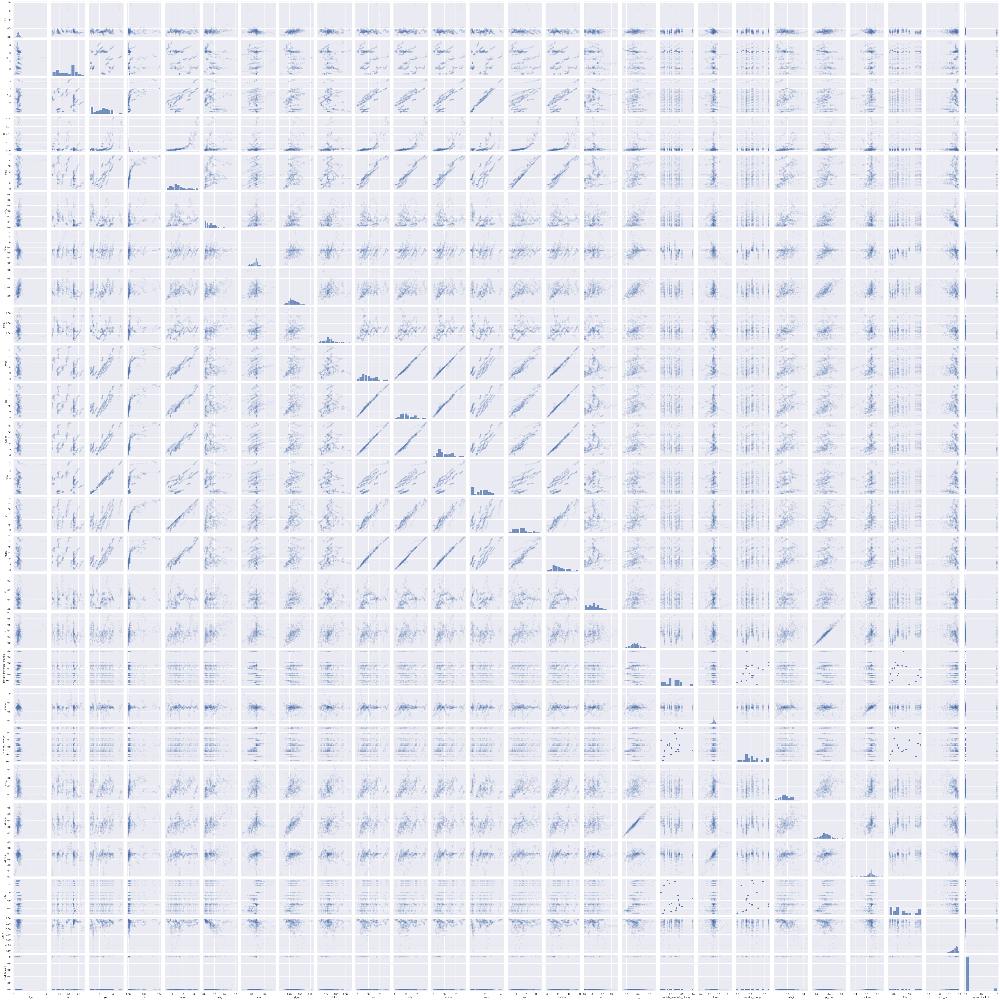

In [16]:
# There appears to be no NaN values in the data set. Our dataset is perfectly filtered.
# We will now generate pairplot visuals to better understand the target and feature-target relationships
sns.pairplot(smaller_data, plot_kws=dict(alpha=.1, edgecolor='none'))

From the pairplot above we can see that the target variable does not seem to have a linear relationship with any of the features.
We will now:

    * Calculate the correlations between the dependent variables.
    * Create a histogram of the correlation values
    * Identify those that are most correlated (either positively or negatively).

In [17]:
# Calculate the correlation values
feature_cols = data.columns[:-1]
corr_values = data[feature_cols].corr()
corr_values

,pop,emp,emp_to_pop_ratio,hc,ccon,cda,cn,ck,ctfp,cwtfp,...,forestry,agriculture,fish,total_change,excl_energy_change,energy_change,metals_minerals_change,forestry_change,agriculture_change,fish_change
pop,1.000000,0.984654,0.168562,-0.263149,0.798407,0.775894,0.655499,0.597614,-0.148329,-0.192712,...,0.067224,0.068205,0.076552,-0.032762,-0.018059,-0.038106,-0.031183,0.019097,-0.027222,0.015427
emp,0.984654,1.000000,0.307262,-0.244473,0.766724,0.744574,0.641270,0.585860,-0.210342,-0.261425,...,0.079274,0.080308,0.090389,-0.038544,-0.021419,-0.044782,-0.036223,0.021719,-0.032285,0.017776
emp_to_pop_ratio,0.168562,0.307262,1.000000,-0.134238,-0.105012,-0.109591,-0.055450,-0.079570,-0.637960,-0.643877,...,0.078206,0.078355,0.089994,-0.036965,-0.024547,-0.041510,-0.035527,0.015503,-0.033934,0.020373
hc,-0.263149,-0.244473,-0.134238,1.000000,0.227289,0.245912,0.331056,0.202484,0.431156,0.373653,...,0.143941,0.140756,0.164362,-0.068397,-0.037893,-0.079536,-0.064597,0.040629,-0.058749,0.033226
ccon,0.798407,0.766724,-0.105012,0.227289,1.000000,0.996126,0.925094,0.791930,0.335876,0.271803,...,0.142387,0.155449,0.161989,-0.074666,-0.042626,-0.086418,-0.070975,0.036438,-0.059360,0.034822
cda,0.775894,0.744574,-0.109591,0.245912,0.996126,1.000000,0.942754,0.794187,0.345433,0.276218,...,0.153186,0.175281,0.171188,-0.078936,-0.043981,-0.092116,-0.077039,0.040492,-0.059359,0.039791
cn,0.655499,0.641270,-0.055450,0.331056,0.925094,0.942754,1.000000,0.800331,0.277746,0.199131,...,0.238011,0.266602,0.267586,-0.123168,-0.070780,-0.140358,-0.123776,0.064881,-0.092741,0.058321
ck,0.597614,0.585860,-0.079570,0.202484,0.791930,0.794187,0.800331,1.000000,0.216159,0.137676,...,0.131505,0.169256,0.137248,-0.070861,-0.042734,-0.077997,-0.084566,0.043287,-0.044689,0.044376
ctfp,-0.148329,-0.210342,-0.637960,0.431156,0.335876,0.345433,0.277746,0.216159,1.000000,0.952274,...,-0.093093,-0.100294,-0.102708,0.064707,0.049588,0.064613,0.090258,-0.048610,0.058106,-0.038991
cwtfp,-0.192712,-0.261425,-0.643877,0.373653,0.271803,0.276218,0.199131,0.137676,0.952274,1.000000,...,-0.070819,-0.040531,-0.076330,0.020168,0.011825,0.021327,0.031609,-0.039194,0.024874,-0.030772


In [18]:
# Simplify by emptying all the data below the diagonal
tril_index = np.tril_indices_from(corr_values)
tril_index

(array([ 0,  1,  1, ..., 48, 48, 48]), array([ 0,  0,  1, ..., 46, 47, 48]))

In [19]:
# Make the unused values NaNs
corr_array = np.array(corr_values)
corr_array[np.tril_indices_from(corr_values)] = np.nan
pd.DataFrame(corr_array)
# now we have nulled out all the values on the diagonal and below 

,0,1,2,3,4,5,6,7,8,9,...,39,40,41,42,43,44,45,46,47,48
0,NaN,0.984654,0.168562,-0.263149,0.798407,0.775894,0.655499,0.597614,-0.148329,-0.192712,...,0.067224,0.068205,0.076552,-0.032762,-0.018059,-0.038106,-0.031183,0.019097,-0.027222,0.015427
1,NaN,NaN,0.307262,-0.244473,0.766724,0.744574,0.641270,0.585860,-0.210342,-0.261425,...,0.079274,0.080308,0.090389,-0.038544,-0.021419,-0.044782,-0.036223,0.021719,-0.032285,0.017776
2,NaN,NaN,NaN,-0.134238,-0.105012,-0.109591,-0.055450,-0.079570,-0.637960,-0.643877,...,0.078206,0.078355,0.089994,-0.036965,-0.024547,-0.041510,-0.035527,0.015503,-0.033934,0.020373
3,NaN,NaN,NaN,NaN,0.227289,0.245912,0.331056,0.202484,0.431156,0.373653,...,0.143941,0.140756,0.164362,-0.068397,-0.037893,-0.079536,-0.064597,0.040629,-0.058749,0.033226
4,NaN,NaN,NaN,NaN,NaN,0.996126,0.925094,0.791930,0.335876,0.271803,...,0.142387,0.155449,0.161989,-0.074666,-0.042626,-0.086418,-0.070975,0.036438,-0.059360,0.034822
5,NaN,NaN,NaN,NaN,NaN,NaN,0.942754,0.794187,0.345433,0.276218,...,0.153186,0.175281,0.171188,-0.078936,-0.043981,-0.092116,-0.077039,0.040492,-0.059359,0.039791
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.800331,0.277746,0.199131,...,0.238011,0.266602,0.267586,-0.123168,-0.070780,-0.140358,-0.123776,0.064881,-0.092741,0.058321
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.216159,0.137676,...,0.131505,0.169256,0.137248,-0.070861,-0.042734,-0.077997,-0.084566,0.043287,-0.044689,0.044376
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.952274,...,-0.093093,-0.100294,-0.102708,0.064707,0.049588,0.064613,0.090258,-0.048610,0.058106,-0.038991
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.070819,-0.040531,-0.076330,0.020168,0.011825,0.021327,0.031609,-0.039194,0.024874,-0.030772


In [20]:
# Now we recreate correlation pandas dataframe
corr_values = pd.DataFrame(corr_array,columns = corr_values.columns, index= corr_values.index)
corr_values.stack().to_frame().reset_index()

,level_0,level_1,0
0,pop,emp,0.984654
1,pop,emp_to_pop_ratio,0.168562
2,pop,hc,-0.263149
3,pop,ccon,0.798407
4,pop,cda,0.775894
...,...,...,...
1171,metals_minerals_change,agriculture_change,0.563110
1172,metals_minerals_change,fish_change,-0.026217
1173,forestry_change,agriculture_change,0.362851
1174,forestry_change,fish_change,0.531899


In [21]:
# We stack the data and convert to a data frame
corr_values = (corr_values
               .stack()
               .to_frame()
               .reset_index()
               .rename(columns={'level_0':'feature1',
                                'level_1':'feature2',
                                0:'correlation'}))

# Get the absolute values for sorting
corr_values['abs_correlation'] = corr_values.correlation.abs()

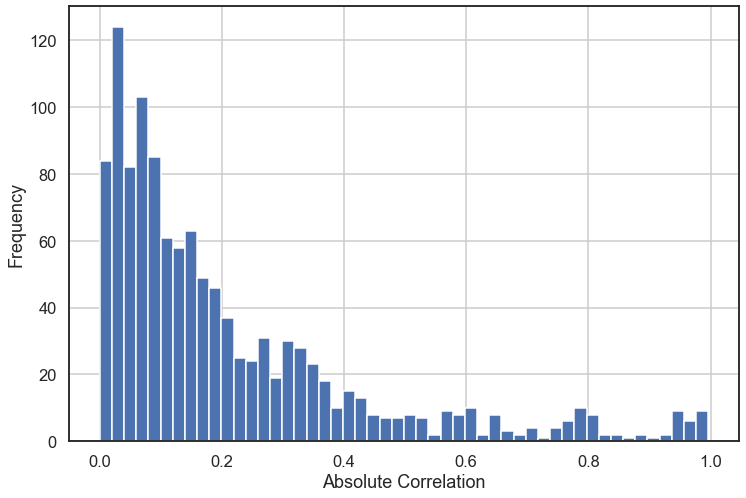

In [22]:
# We show a histogram of the absolute value correlations.
sns.set_context('talk')
sns.set_style('white')

ax = corr_values.abs_correlation.hist(bins=50, figsize=(12, 8))
ax.set(xlabel='Absolute Correlation', ylabel='Frequency');

- These are the most highly correlated values.
- Values are sorted by correlation going from top to bottom. We only want values from 0.8 onwards.

In [23]:
corr_values.sort_values('correlation', ascending=False).query('abs_correlation>0.8')

,feature1,feature2,correlation,abs_correlation
186,ccon,cda,0.996126,0.996126
435,rconna,rdana,0.995123,0.995123
191,ccon,rconna,0.991240,0.991240
235,cda,rdana,0.991137,0.991137
1086,total,energy,0.989196,0.989196
192,ccon,rdana,0.988126,0.988126
234,cda,rconna,0.986314,0.986314
0,pop,emp,0.984654,0.984654
770,pl_con,pl_da,0.977060,0.977060
798,pl_da,pl_gdpo,0.975777,0.975777


We now split the data into train and test data sets before we try the Logistic Regression model.
We will be using Scikit-learn's `StratifiedShuffleSplit` to maintain the same ratio of predictor classes.

In [50]:
from sklearn.model_selection import StratifiedShuffleSplit

# Get the split indexes
strat_shuf_split = StratifiedShuffleSplit(n_splits=1, 
                                          test_size=0.3, 
                                          random_state=42)

train_idx, test_idx = next(strat_shuf_split.split(data[feature_cols], data.growthbucket))

# Create the dataframes
X_train = data.loc[train_idx, feature_cols]
y_train = data.loc[train_idx, 'growthbucket']

X_test  = data.loc[test_idx, feature_cols]
y_test  = data.loc[test_idx, 'growthbucket']

In [51]:
y_train.value_counts(normalize=True)

0    0.920588
1    0.079412
Name: growthbucket, dtype: float64

## Classifier Model 1: Logistic Regression

In [52]:
# We fit a logistic regression model without any regularization using all of the features
from sklearn.linear_model import LogisticRegression

# Standard logistic regression
lr = LogisticRegression(solver='liblinear').fit(X_train, y_train)
# liblinear is the "One vs the Rest" method.

In [55]:
from sklearn.linear_model import LogisticRegressionCV
# L1 regularized logistic regression. We used LogisticRegressionCV because it works like cv grid search.
# It will check against 10 default values of that CValue and then we can optimize from there.
lr_l1 = LogisticRegressionCV(Cs=10, cv=5, penalty='l1', max_iter=1000, solver='liblinear').fit(X_train, y_train)

# L2 regularized logistic regression
lr_l2 = LogisticRegressionCV(Cs=10, cv=5, penalty='l2', max_iter=1000, solver='liblinear').fit(X_train, y_train)

In [73]:
# Combine all the coefficients into a dataframe
coefficients = list()

coeff_labels = ['lr', 'l1', 'l2']
coeff_models = [lr, lr_l1, lr_l2]

for lab,mod in zip(coeff_labels, coeff_models):
    coeffs = mod.coef_
    coeff_label = pd.MultiIndex(levels=[[lab], [0]], 
                                 codes=[[0], [0]])
    coefficients.append(pd.DataFrame(coeffs.T, columns=coeff_label))

coefficients = pd.concat(coefficients, axis=1)

coefficients.sample(10)

,lr,l1,l2
,0,0,0
15,-0.303797,0.0,-1.151993e-04
44,0.924955,0.0,1.684318e-04
9,-0.661641,0.0,-2.861378e-04
47,0.203679,0.0,9.972202e-06
17,0.039872,0.0,-9.416069e-06
18,0.019871,0.0,-8.873865e-07
31,-0.880191,0.0,-1.793979e-04
34,-0.521691,0.0,-1.299903e-04
5,0.086030,0.0,-9.298099e-04


In [90]:
# Predict the class and the probability for each model
y_pred = list()
y_prob = list()

coeff_labels = ['lr', 'l1', 'l2']
coeff_models = [lr, lr_l1, lr_l2]

for lab,mod in zip(coeff_labels, coeff_models):
    y_pred.append(pd.Series(mod.predict(X_test), name=lab))
    y_prob.append(pd.Series(mod.predict_proba(X_test).max(axis=1), name=lab))
    
y_pred = pd.concat(y_pred, axis=1)
y_prob = pd.concat(y_prob, axis=1)

y_pred.head()

,lr,l1,l2
0,0,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,0,0,0


In [91]:
y_prob.head()

,lr,l1,l2
0,0.976750,0.943937,0.946737
1,0.981146,0.943937,0.946703
2,0.996019,0.955949,0.967219
3,0.926300,0.768842,0.861033
4,0.628333,0.864036,0.926122


For each model, we calculate the following error metrics: 

* Accuracy
* Precision
* Recall
* F-score
* Confusion Matrix

In [97]:
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import confusion_matrix, accuracy_score

metrics = list()
cm = dict()

for lab in coeff_labels:

    # Precision, recall, f-score from the multi-class support function
    precision, recall, fscore, _ = score(y_test, y_pred[lab], average='micro')
    
    # The usual way to calculate accuracy
    accuracy = accuracy_score(y_test, y_pred[lab])
    
    
    
    # Last, the confusion matrix
    cm[lab] = confusion_matrix(y_test, y_pred[lab])
    
    metrics.append(pd.Series({'precision':precision, 'recall':recall, 
                              'fscore':fscore, 'accuracy':accuracy
                             }, 
                             name=lab))

metrics = pd.concat(metrics, axis=1)

In [98]:
metrics

,lr,l1,l2
precision,0.924658,0.924658,0.924658
recall,0.924658,0.924658,0.924658
fscore,0.924658,0.924658,0.924658
accuracy,0.924658,0.924658,0.924658


We note that the precision, recall, f score and accuracy are the same due to how we configured the Logistic Regression algorithm. 
The percentage rate for this model is 92.46% though, which is relatively high.

## Classifier Model 2: K-Nearest Neighbors

In [112]:
data.describe().T
# We notice that the variables are on different scales

,count,mean,std,min,25%,50%,75%,max
lr,49.0,0.009720,0.410856,-1.188556,-0.135816,0.021466,0.203679,0.924955
l1,49.0,-0.000039,0.000273,-0.001909,0.000000,0.000000,0.000000,0.000000
l2,49.0,-0.000239,0.000640,-0.003217,-0.000286,-0.000011,0.000025,0.001123


In [113]:
# We scale the data 
from sklearn.preprocessing import MinMaxScaler
mm = MinMaxScaler()

In [115]:
mm.fit_transform(data)

array([[0.70676274, 1.        , 0.59241331],
       [0.56991111, 1.        , 0.63070352],
       [0.57491358, 1.        , 0.75958732],
       [0.91271495, 1.        , 0.81461025],
       [0.73085468, 1.        , 0.53237512],
       [0.60306569, 1.        , 0.5270829 ],
       [0.90402544, 1.        , 0.6292542 ],
       [0.57251731, 1.        , 0.74078342],
       [0.30477549, 1.        , 0.67909744],
       [0.24930811, 1.        , 0.67539522],
       [0.19907778, 1.        , 0.45526109],
       [0.        , 1.        , 0.43716218],
       [0.61442072, 1.        , 0.57684282],
       [0.55436582, 1.        , 0.75824428],
       [0.64360328, 1.        , 0.73971989],
       [0.41862027, 1.        , 0.71478219],
       [0.75312592, 1.        , 0.76348878],
       [0.58122618, 1.        , 0.73915634],
       [0.57176276, 1.        , 0.74112148],
       [0.55608027, 1.        , 0.71298018],
       [0.59908399, 1.        , 0.74489282],
       [0.56911034, 1.        , 0.73888243],
       [0.

In [118]:
round(data.describe().T, 3)
# Now they are all on a similar scale

,count,mean,std,min,25%,50%,75%,max
lr,49.0,0.01,0.411,-1.189,-0.136,0.021,0.204,0.925
l1,49.0,-0.00,0.000,-0.002,0.000,0.000,0.000,0.000
l2,49.0,-0.00,0.001,-0.003,-0.000,-0.000,0.000,0.001


In [126]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, f1_score

# Estimate KNN model and report outcomes
knn = KNeighborsClassifier(n_neighbors=4)
knn = knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
# Precision, recall, f-score from the multi-class support function
print(classification_report(y_test, y_pred))
print('Accuracy score: ', round(accuracy_score(y_test, y_pred), 2))
print('F1 Score: ', round(f1_score(y_test, y_pred), 2))

C:\Users\Khobie Maseko\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


              precision    recall  f1-score   support

           0       0.93      0.99      0.96       135
           1       0.50      0.09      0.15        11

    accuracy                           0.92       146
   macro avg       0.72      0.54      0.56       146
weighted avg       0.90      0.92      0.90       146

Accuracy score:  0.92
F1 Score:  0.15


Text(0.5, 76.5, 'Ground Truth')

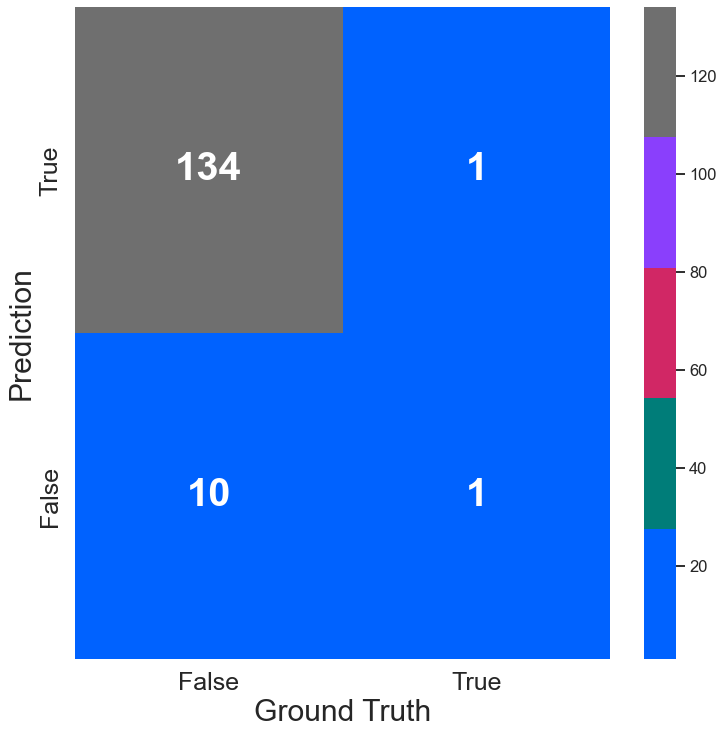

In [127]:
# Plot confusion matrix
# The blue squares are the incorrect values that we predicted
sns.set_palette(sns.color_palette(colors))
_, ax = plt.subplots(figsize=(12,12))
ax = sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap=colors, annot_kws={"size": 40, "weight": "bold"})  
labels = ['False', 'True']
ax.set_xticklabels(labels, fontsize=25);
ax.set_yticklabels(labels[::-1], fontsize=25);
ax.set_ylabel('Prediction', fontsize=30);
ax.set_xlabel('Ground Truth', fontsize=30)

We noted that the accuracy score for this KNN model is 92.00%, which is lower than the Logistic Regression model's score. The F1 score is also low (15%).


## Classifier Model 3: Random Forest and Out Of Bag Errors

We will fit random forest models with a range of tree numbers and evaluate the out-of-bag error for each of these models.

In [136]:
# Suppress warnings about too few trees from the early models
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

In [137]:
from sklearn.ensemble import RandomForestClassifier

# Initialize the random forest estimator

RF = RandomForestClassifier(oob_score=True, 
                            random_state=42, 
                            warm_start=True,
                            n_jobs=-1)

oob_list = list()

# Iterate through all of the possibilities for 
# number of trees
for n_trees in [15, 20, 30, 40, 50, 100, 150, 200, 300, 400]:
    
    # Use this to set the number of trees
    RF.set_params(n_estimators=n_trees)

    # Fit the model
    RF.fit(X_train, y_train)

    # Get the oob error
    oob_error = 1 - RF.oob_score_
    
    # Store it
    oob_list.append(pd.Series({'n_trees': n_trees, 'oob': oob_error}))

rf_oob_df = pd.concat(oob_list, axis=1).T.set_index('n_trees')

rf_oob_df

,oob
n_trees,
15.0,0.079412
20.0,0.082353
30.0,0.073529
40.0,0.076471
50.0,0.076471
100.0,0.076471
150.0,0.076471
200.0,0.076471
300.0,0.076471


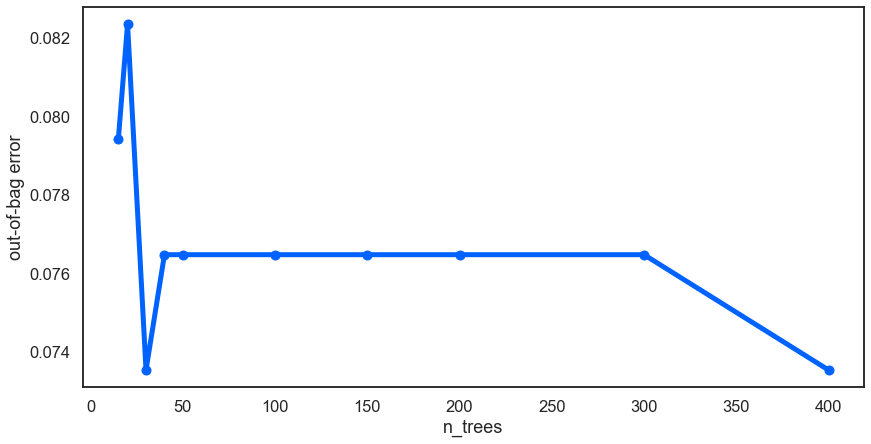

In [138]:
sns.set_context('talk')
sns.set_style('white')

ax = rf_oob_df.plot(legend=False, marker='o', figsize=(14, 7), linewidth=5)
ax.set(ylabel='out-of-bag error');

The error looks like it has stabilized at around 40 trees. This is where it plateaus. We will now use extra randomized trees (`ExtraTreesClassifier`). We will then compare the out-of-bag errors for the two different types of models.

In [140]:
from sklearn.ensemble import ExtraTreesClassifier

# Initialize the random forest estimator
# Note that the number of trees is not setup here
EF = ExtraTreesClassifier(oob_score=True, 
                          random_state=42, 
                          warm_start=True,
                          bootstrap=True,
                          n_jobs=-1)

oob_list = list()

# Iterate through all of the possibilities for 
# number of trees
for n_trees in [15, 20, 30, 40, 50, 100, 150, 200, 300, 400]:
    
    # Use this to set the number of trees
    EF.set_params(n_estimators=n_trees)
    EF.fit(X_train, y_train)

    # oob error
    oob_error = 1 - EF.oob_score_
    oob_list.append(pd.Series({'n_trees': n_trees, 'oob': oob_error}))

et_oob_df = pd.concat(oob_list, axis=1).T.set_index('n_trees')

et_oob_df

,oob
n_trees,
15.0,0.094118
20.0,0.094118
30.0,0.085294
40.0,0.082353
50.0,0.082353
100.0,0.067647
150.0,0.067647
200.0,0.064706
300.0,0.064706


In [141]:
# We will combine the two dataframes into a single one for easier plotting.
oob_df = pd.concat([rf_oob_df.rename(columns={'oob':'RandomForest'}),
                    et_oob_df.rename(columns={'oob':'ExtraTrees'})], axis=1)

oob_df

,RandomForest,ExtraTrees
n_trees,,
15.0,0.079412,0.094118
20.0,0.082353,0.094118
30.0,0.073529,0.085294
40.0,0.076471,0.082353
50.0,0.076471,0.082353
100.0,0.076471,0.067647
150.0,0.076471,0.067647
200.0,0.076471,0.064706
300.0,0.076471,0.064706


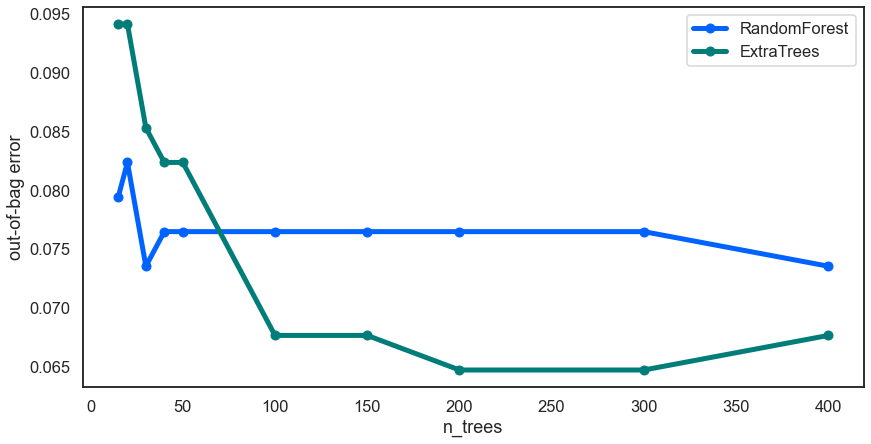

In [142]:
sns.set_context('talk')
sns.set_style('white')

ax = oob_df.plot(marker='o', figsize=(14, 7), linewidth=5)
ax.set(ylabel='out-of-bag error');

We note that the extra randomized trees model performs better than the random forest model.

In [145]:
from sklearn.metrics import f1_score, roc_auc_score
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score

cr = classification_report(y_test, y_pred)
print(cr)

score_df = pd.DataFrame({'accuracy': accuracy_score(y_test, y_pred),
                         'precision': precision_score(y_test, y_pred),
                         'recall': recall_score(y_test, y_pred),
                         'f1': f1_score(y_test, y_pred),
                         'auc': roc_auc_score(y_test, y_pred)},
                         index=pd.Index([0]))

print(score_df)

              precision    recall  f1-score   support

           0       0.94      0.98      0.96       135
           1       0.40      0.18      0.25        11

    accuracy                           0.92       146
   macro avg       0.67      0.58      0.60       146
weighted avg       0.90      0.92      0.90       146

   accuracy  precision    recall    f1       auc
0  0.917808        0.4  0.181818  0.25  0.579798


We note that the precision, f1, support score and recall for "0" are high but low for "1". The general accuracy score is 91.77% which is lower than the Logistic Regression and the KNN models' scores.

Text(0.5, 76.5, 'Ground Truth')

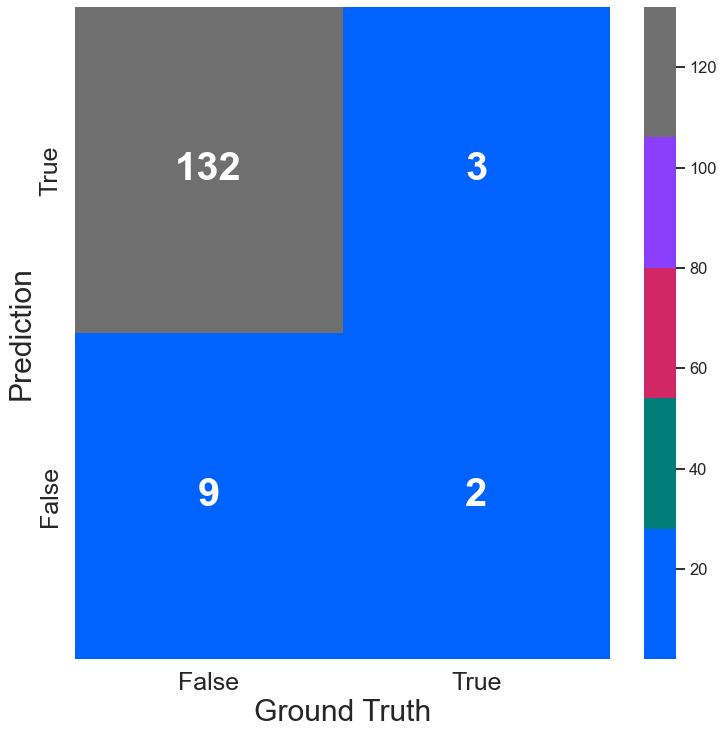

In [146]:
sns.set_context('talk')
cm = confusion_matrix(y_test, y_pred)
_, ax = plt.subplots(figsize=(12,12))
ax = sns.heatmap(cm, annot=True, fmt='d', cmap=colors, annot_kws={"size": 40, "weight": "bold"})

labels = ['False', 'True']
ax.set_xticklabels(labels, fontsize=25);
ax.set_yticklabels(labels[::-1], fontsize=25);
ax.set_ylabel('Prediction', fontsize=30);
ax.set_xlabel('Ground Truth', fontsize=30)

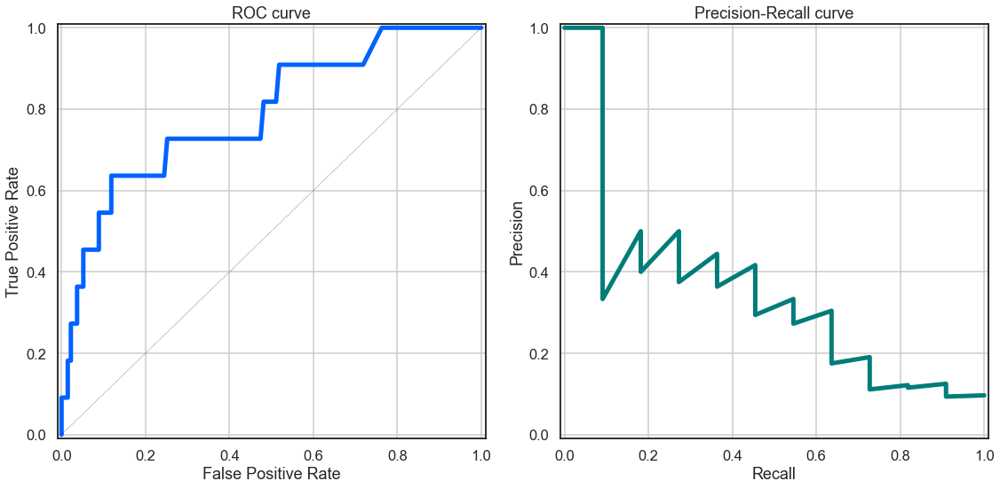

In [158]:
from sklearn.metrics import roc_curve, precision_recall_curve, confusion_matrix
sns.set_context('talk')

fig, axList = plt.subplots(ncols=2)
fig.set_size_inches(16, 8)

# Get the probabilities for each of the two categories
y_prob = model.predict_proba(X_test)

# Plot the ROC-AUC curve
ax = axList[0]

fpr, tpr, thresholds = roc_curve(y_test, y_prob[:,1])
ax.plot(fpr, tpr, color=colors[0], linewidth=5)
# It is customary to draw a diagonal dotted line in ROC plots.
# This is to indicate completely random prediction. Deviation from this
# dotted line towards the upper left corner signifies the power of the model.
ax.plot([0, 1], [0, 1], ls='--', color='black', lw=.3)
ax.set(xlabel='False Positive Rate',
       ylabel='True Positive Rate',
       xlim=[-.01, 1.01], ylim=[-.01, 1.01],
       title='ROC curve')
ax.grid(True)

# Plot the precision-recall curve
ax = axList[1]

precision, recall, _ = precision_recall_curve(y_test, y_prob[:,1])
ax.plot(recall, precision, color=colors[1], linewidth=5)
ax.set(xlabel='Recall', ylabel='Precision',
       xlim=[-.01, 1.01], ylim=[-.01, 1.01],
       title='Precision-Recall curve')
ax.grid(True)

plt.tight_layout()

We note that the ROC curve is far from the top left corner so the test is not efficient. This makes sense since this data is imbalanced. The Precision recall curve is also not efficient for this data. This is all due to the data's accuracy being low for the "1" class as noted before.

## Conclusion

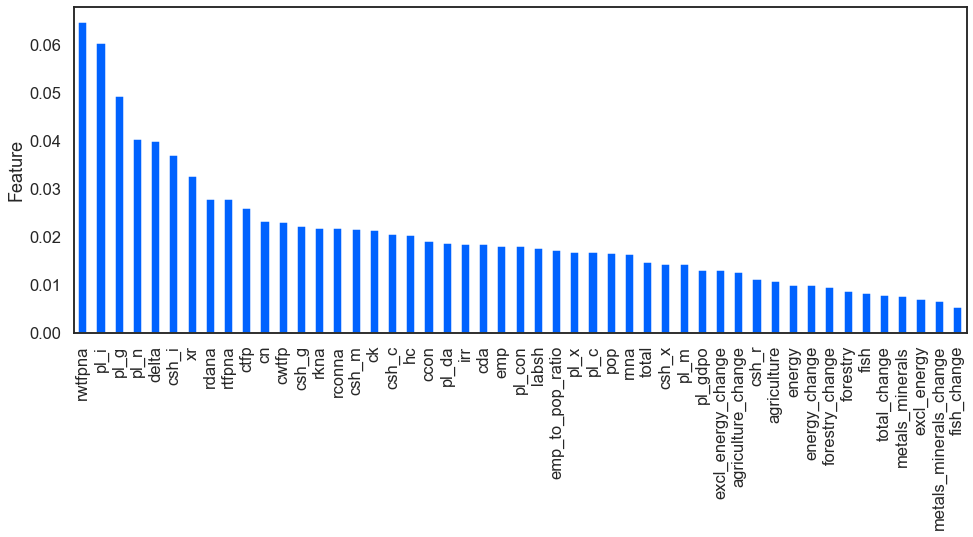

In [159]:
feature_imp = pd.Series(model.feature_importances_, index=feature_cols).sort_values(ascending=False)

ax = feature_imp.plot(kind='bar', figsize=(16, 6))
ax.set(ylabel='Relative Importance');
ax.set(ylabel='Feature');

The above bar chart shows us which features are the most important when it comes to determining which features have the most influence on the target variable. In this case it is the "rwtfpna" (TFP at constant national prices (2011=1) feature. This feature is basically the portion of output that is not explained by the amount of inputs used in production for the reference year 2011.

We can also conclude that the best model to use on this dataset is the Logistic Regression model. It has the highest accuracy score, although not by much as compared to the KNN and Random Trees models. 